In [7]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [5]:
# Setting some hyperparameters

batch_size = 64 # We set the size of the batch.
image_size = 64 # We set the size of the generated images (64x64).

# We can use an image folder dataset the way we have it setup.
# Create the dataset
# Creating the transformations
dataset = dset.ImageFolder(root=r"C:\Personal Growth\GUJCOST\GANs\celeb",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=2)

C:\Users\kolhe\anaconda3\lib\site-packages\torchvision\transforms\transforms.py:210: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  warnings.warn("The use of the transforms.Scale transform is deprecated, " +


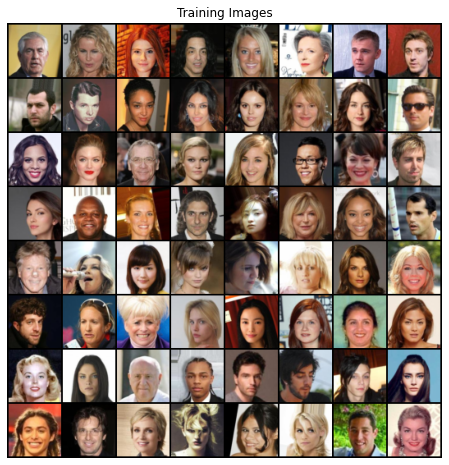

In [8]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [3]:
# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 25

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Weight Initialization

#### From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. 

#### The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.

#### Defining the weights_init function that takes as input a neural network m and that will initialize all its weights.

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator

#### The inputs we set in the input section (nz, ngf, and nc) influence the generator architecture in code. 

#### nz is the length of the z input vector, ngf relates to the size of the feature maps that are propagated through the generator, and nc is the number of channels in the output image (set to 3 for RGB images). 

<img src='https://pytorch.org/tutorials/_images/dcgan_generator.png'>

In [5]:
# We introduce a class to define the generator
class Generator(nn.Module):
    
    # We introduce the __init__() function that will define the architecture of the generator.
    def __init__(self, ngpu):
        
        # We inherit from the nn.Module tools.
        super(Generator, self).__init__()
        # use gpu if available
        self.ngpu = ngpu
        
        # We create a meta module of a neural network that will contain a sequence of modules (convolutions, full connections, etc.).
        self.main = nn.Sequential(
            
            # We start with an inversed convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            
            # We normalize all the features along the dimension of the batch
            nn.BatchNorm2d(ngf * 8),
            
            # We apply a ReLU rectification to break the linearity.
            nn.ReLU(True),
            
            # We add another inversed convolution.
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            
            # We normalize again.
            nn.BatchNorm2d(ngf * 4),
            
            # We apply another ReLU.
            nn.ReLU(True),
            
            # We add another inversed convolution.
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            
            # We normalize again.
            nn.BatchNorm2d(ngf * 2),
            
            # We apply another ReLU.
            nn.ReLU(True),
            
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            
            # state size. (ngf) x 32 x 32
            # Here, we are taking output as nc = 3, because our generator will generate images with 3 channels RBG
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            
            # We apply a Tanh rectification to break the linearity and stay between -1 and +1
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

        
        
    # We define the forward function that takes as argument an input that will be fed to the neural network, 
    # and that will return the output containing the generated images.
    def forward(self, input):
        # We forward propagate the signal through the whole neural network of the generator defined by self.main.
        # We return the output containing the generated images.
        return self.main(input)


# Creating the generator

#### Now, we can instantiate the generator and apply the weights_init

In [6]:
# We create the generator object.
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# We initialize all the weights of its neural network
# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Discriminator

#### As mentioned, the discriminator, D, is a binary classification network that takes an image as input and outputs a scalar probability that the input image is real (as opposed to fake). 

#### Here, D takes a 3x64x64 input image, processes it through a series of Conv2d, BatchNorm2d, and LeakyReLU layers, and outputs the final probability through a Sigmoid activation function.

<img src="https://d3i71xaburhd42.cloudfront.net/110ee8ab8f652c16fcc3bb767687e1c695c2500b/11-Figure11-1.png">

In [7]:
# We introduce a class to define the discriminator.
class Discriminator(nn.Module):
    
    # We introduce the __init__() function that will define the architecture of the discriminator.
    def __init__(self, ngpu):
        
        # We inherit from the nn.Module tools.
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        
        # We create a meta module of a neural network that will contain a sequence of modules (convolutions, full connections, etc.).
        self.main = nn.Sequential(
            
            # We start with a convolution.
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            
            # We apply a LeakyReLU.
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf) x 32 x 32
            # We add another convolution.
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            # We normalize all the features along the dimension of the batch.
            nn.BatchNorm2d(ndf * 2),
            # We apply another LeakyReLU.
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            
            # We apply a Sigmoid rectification to break the linearity and stay between 0 and 1.
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Creating a Discriminator

#### Now, as with the generator, we can create the discriminator, apply the weights_init function, and print the model’s structure.

In [8]:
# We create the discriminator object.
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# We initialize all the weights of its neural network.
# Apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize BCELoss function
# BCE means Binary Cross Entropy
# We create a criterion object that will measure the error between the prediction and the target.
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
# Hyperparameters
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # 1st Step: Updating the weights of the neural network of the discriminator
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        
        # We initialize to 0 the gradients of the discriminator with respect to the weights.
        netD.zero_grad()
        
        
        
        
        # Training the discriminator with a real image of the dataset
        # We get a real image of the dataset which will be used to train the discriminator.
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        
        # We get the target.
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forward pass real batch through D
        # We forward propagate this real image into the neural network of the discriminator to get the prediction 
        # (a value between 0 and 1).
        output = netD(real_cpu).view(-1)
        
        # Calculate loss on all-real batch
        # We compute the loss between the predictions (output) and the target (equal to 1).
        errD_real = criterion(output, label)
        
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        
        
        
        # Training the discriminator with a fake image generated by the generator
        # We make a random input vector (noise) of the generator.
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        
        # Generate fake image batch with G
        # We forward propagate this random input vector into the neural network of the generator to get some fake generated images.
        fake = netG(noise)
        
        # We get the target of fake images
        label.fill_(fake_label)
        
        # Classify all fake batch with D
        # We forward propagate the fake generated images into the neural network of the discriminator to get the prediction (a value between 0 and 1).
        output = netD(fake.detach()).view(-1)
        
        # Calculate D's loss on the all-fake batch
        # We compute the loss between the prediction (output) and the target (equal to 0).
        errD_fake = criterion(output, label)
        
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        
        # Update D
        # We apply the optimizer to update the weights according to how much they are responsible for the loss error of the discriminator.
        optimizerD.step()

       
        
        
        
        
        ############################
        # 2nd Step: Updating the weights of the neural network of the generator
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        
        # We initialize to 0 the gradients of the generator with respect to the weights.
        netG.zero_grad()
        
        # We get the target.
        # fake labels are real for generator cost
        label.fill_(real_label)
        
        # Since we just updated D, perform another forward pass of all-fake batch through D
        # We forward propagate the fake generated images into the neural network of the discriminator to get the prediction (a value between 0 and 1).
        output = netD(fake).view(-1)

        # Calculate G's loss based on this output
        # We compute the loss between the prediction (output between 0 and 1) and the target (equal to 1).
        errG = criterion(output, label)
        
        # Calculate gradients for G
        # We backpropagate the loss error by computing the gradients of the total error with respect to the weights of the generator.
        errG.backward()
        D_G_z2 = output.mean().item()
        
        # Update G
        # We apply the optimizer to update the weights according to how much they are responsible for the loss error of the generator.
        optimizerG.step()

        
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize = True)

        iters += 1

MovieWriter ffmpeg unavailable; using Pillow instead.


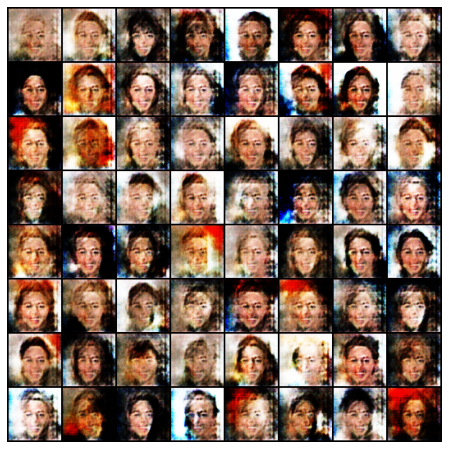

In [13]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani.save('celeb.gif')

HTML(ani.to_jshtml())